<a href="https://colab.research.google.com/github/SJinLee/XAI2023/blob/main/x4.SHAP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1. [SHAP(SHapley Additive exPlanation)](https://velog.io/@tobigs_xai/2%EC%A3%BC%EC%B0%A8-SHAP-SHapley-Additive-exPlanation)
2. [SHAP for image classification/](https://cgarbin.github.io/shap-experiments-image-classification/)

In [1]:
from google.colab import drive
drive.mount('drive')

Mounted at drive


In [2]:
!rm -r train valid
!unzip drive/MyDrive/xai/car_or_truck.zip > /dev/null

rm: cannot remove 'train': No such file or directory
rm: cannot remove 'valid': No such file or directory


In [3]:
import os, warnings
import matplotlib.pyplot as plt
from matplotlib import gridspec

import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory

In [4]:
def set_seed(seed=31415):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
set_seed(31415)

In [5]:
plt.rc('figure', autolayout=True)
plt.rc('axes', labelweight='bold', labelsize='large',
       titleweight='bold', titlesize=18, titlepad=10)
plt.rc('image', cmap='magma')
warnings.filterwarnings("ignore")

In [6]:
ds_train_ = image_dataset_from_directory(
    'train',
    labels='inferred',
    label_mode='binary',
    image_size=[128, 128],
    interpolation='nearest',
    batch_size=64,
    shuffle=True,
)
ds_valid_ = image_dataset_from_directory(
    'valid',
    labels='inferred',
    label_mode='binary',
    image_size=[128, 128],
    interpolation='nearest',
    batch_size=64,
    shuffle=False,
)

Found 5117 files belonging to 2 classes.
Found 5051 files belonging to 2 classes.


In [7]:
# Data Pipeline
def convert_to_float(image, label):
    image = tf.image.convert_image_dtype(image, dtype=tf.float32)
    return image, label

AUTOTUNE = tf.data.experimental.AUTOTUNE
ds_train = (
    ds_train_
    .map(convert_to_float)
    .cache()
    .prefetch(buffer_size=AUTOTUNE)
)
ds_valid = (
    ds_valid_
    .map(convert_to_float)
    .cache()
    .prefetch(buffer_size=AUTOTUNE)
)

In [8]:
!rm -rf cv-course-models
!unzip drive/MyDrive/xai/base_models.zip > /dev/null

In [9]:
pretrained_base = tf.keras.models.load_model(
    'cv-course-models/vgg16-pretrained-base',
)
pretrained_base.trainable = False

In [10]:
from tensorflow import keras
from tensorflow.keras import layers

model = keras.Sequential([
    pretrained_base,
    layers.Flatten(),
    layers.Dense(6, activation='relu'),
    layers.Dense(1, activation='sigmoid'),
])

In [11]:
checkpoint_filepath = 'save/checkpoint'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True,
    verbose=1)
model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy'],
)

history = model.fit(
    ds_train,
    validation_data=ds_valid,
    epochs=30,
    verbose=1,
    callbacks=[model_checkpoint_callback],
)

model.load_weights(checkpoint_filepath)

Epoch 1/30
80/80 [==============================] - ETA: 0s - loss: 0.6106 - accuracy: 0.6686
Epoch 1: val_loss improved from inf to 0.55400, saving model to save/checkpoint
80/80 [==============================] - 24s 165ms/step - loss: 0.6106 - accuracy: 0.6686 - val_loss: 0.5540 - val_accuracy: 0.6983
Epoch 2/30
80/80 [==============================] - ETA: 0s - loss: 0.5253 - accuracy: 0.7807
Epoch 2: val_loss improved from 0.55400 to 0.51059, saving model to save/checkpoint
80/80 [==============================] - 13s 164ms/step - loss: 0.5253 - accuracy: 0.7807 - val_loss: 0.5106 - val_accuracy: 0.7662
Epoch 3/30
80/80 [==============================] - ETA: 0s - loss: 0.4838 - accuracy: 0.8218
Epoch 3: val_loss improved from 0.51059 to 0.47961, saving model to save/checkpoint
80/80 [==============================] - 13s 166ms/step - loss: 0.4838 - accuracy: 0.8218 - val_loss: 0.4796 - val_accuracy: 0.8068
Epoch 4/30
80/80 [==============================] - ETA: 0s - loss: 0.4518

In [11]:
import pandas as pd
history_frame = pd.DataFrame(history.history)
history_frame.loc[:, ['loss', 'val_loss']].plot()
history_frame.loc[:, ['accuracy', 'val_accuracy']].plot()

In [12]:
pred = model.predict(ds_valid)

79/79 [==============================] - 6s 80ms/step


In [15]:
label = np.concatenate([x[1].numpy() for x in ds_valid])

In [16]:
((pred>0.5)*1==label).mean()

0.8693328053850723

In [17]:
imgs = [x[0].numpy() for x in ds_valid]
img = imgs[0][0]

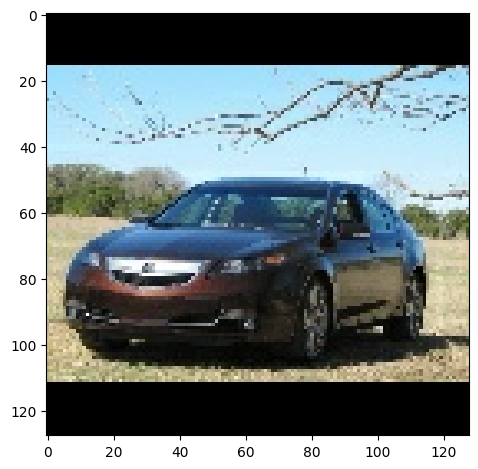

In [18]:
plt.imshow(img)

In [19]:
model.predict(img[np.newaxis,:,:,:])

1/1 [==============================] - 0s 199ms/step


array([[0.00046881]], dtype=float32)

In [20]:
import skimage.segmentation

# 1. 슈퍼픽셀 생성
segments = skimage.segmentation.slic(img, n_segments=100, compactness=10)

In [21]:
segments

array([[ 1,  1,  1, ..., 10, 10, 10],
       [ 1,  1,  1, ..., 10, 10, 10],
       [ 1,  1,  1, ..., 10, 10, 10],
       ...,
       [58, 58, 58, ..., 67, 67, 67],
       [58, 58, 58, ..., 67, 67, 67],
       [58, 58, 58, ..., 67, 67, 67]])

In [24]:
# 2. 인공신경망 예측
original_preds = model.predict(img[np.newaxis,:,:,:])

# SHAP 값을 저장할 빈 리스트 생성
shap_values = []

for i in np.unique(segments):
    # 3. 슈퍼픽셀 편집 (여기서는 슈퍼픽셀을 평균값으로 대체)
    masked_image = img.copy()
    masked_image[segments == i] = np.mean(masked_image[segments == i])

    # 4. 편집된 이미지 예측
    edited_preds = model.predict(masked_image[np.newaxis,:,:,:],verbose=False)

    # 5. SHAP 값 계산
    shap_value = original_preds - edited_preds
    shap_values.append(shap_value)

# 최종 SHAP 값
shap_values = np.array(shap_values)

1/1 [==============================] - 0s 83ms/step


In [46]:
shap_values.min(),shap_values.max()

(-0.008706914, 0.00021962344)

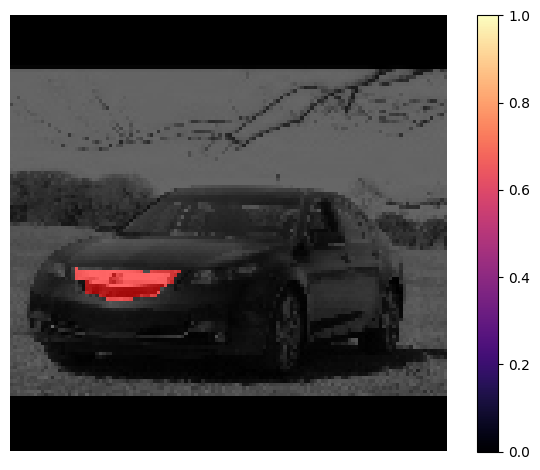

In [47]:
import matplotlib.pyplot as plt
import skimage.color

def visualize_shap_values(image, segments, shap_values):
    # 각 슈퍼픽셀의 SHAP 값을 히트맵으로 변환
    heatmap = np.zeros_like(image[:, :, 0])
    for i, value in enumerate(shap_values):
        heatmap[segments == i] = value[0][0]

    # 히트맵 정규화 (0-1 사이의 값으로 변경)
    heatmap = (heatmap - np.min(heatmap)) / (np.max(heatmap) - np.min(heatmap))

    # 원본 이미지와 히트맵 병합
    overlay = skimage.color.label2rgb(heatmap, image=image, alpha=0.6, bg_label=0, kind='overlay')

    plt.imshow(overlay)
    plt.axis('off')
    plt.colorbar()
    plt.show()
    return heatmap,overlay

# 시각화 함수 호출
heatmap,overlay = visualize_shap_values(img, segments, shap_values)


In [48]:
overlay.min(),overlay.max()

(0.0, 1.0000000059604646)

In [49]:
heatmap.min(),heatmap.max()

(0.0, 1.0)

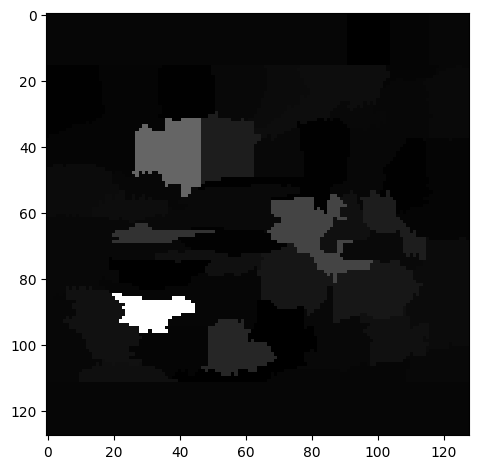

In [51]:
plt.imshow(heatmap,cmap='binary')

In [52]:
heatmap[70,30]

0.96257615

* Deep Shap

In [54]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 5.1 MB/s eta 0:00:00


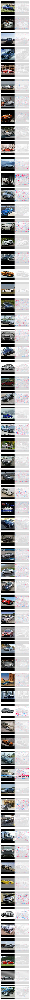

In [69]:
import shap
# Deep SHAP 설명자 초기화
explainer = shap.DeepExplainer(model, img[np.newaxis,:,:,:])

img2 = imgs[1:10][0]
# img2[50:80,20:40,:] = 0
# SHAP 값 계산
shap_values = explainer.shap_values(img2)

# SHAP 값을 사용하여 이미지를 시각화
shap.image_plot(shap_values, img2)

In [68]:
img2.shape

(128, 128, 3)

In [62]:
shap_values[0][0].min(),shap_values[0][0].max()

(0.0, 0.0)

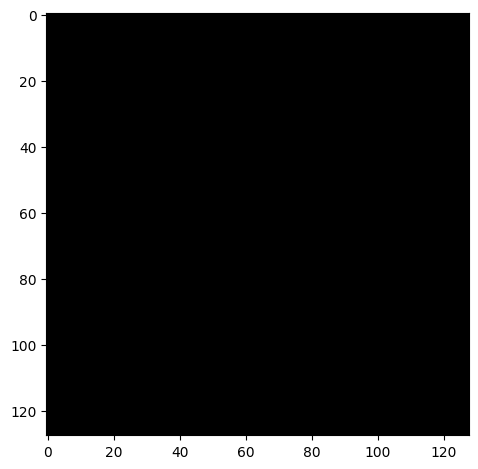

In [61]:
plt.imshow(shap_values[0][0])